# ATSC 528 Homework 3 - Statistical Objective Analysis  

Author: Brian T. Horan  
Created: 11/09/2022  
Assignment: ATSC 528 HW 3  

Purpose: To perform a Statistical Objective Analysis on a polar stereographic projection. Calculates the background of the analysis using a forward interpolation of barnes analysis for points within r_e. Uses forward interpolation (biliner or barnes) at the observation stations to find the background at the observation stations. Calculates the observation increments based on the background for the observations. Creates a background error correllation matrix between N observation stations nearest to the analysis grid point. Creates a background error vector for the difference between the N observation stations and the analyzed grid points. The matrix multiplied times the vector creates a weight vector which is applied to the observation increments and used to find the analysis value coupled with the analysis background for a given N number of available observation stations. Finds and plots the Analyses and Analyses increments. Finds the analysis difference as well as the RMS between the analysis and observation stations.

In [1]:
### Import Required Modules (shouldn't need to change) ###
import numpy as np                 #numpy for math
import matplotlib.pyplot as plt    #matplotlib for plotting
import cartopy.crs as ccrs         #cartopy for plotting on map
import cartopy.feature as cfeature #cartopy basic shapefiles
import pandas as express           #Pandas to open data file

In [2]:
## add some global variables
global k_d
global r_e
global b
global map_proj
global psi_0


psi_0 = 60 * (np.pi/180)
b = ((1+np.sin(40*(np.pi/180)))/(1+np.sin(psi_0))) * -1.24
k_d = 10.8844524
r_e = 12.7775892

In [3]:
#define a method to call barnes to calculate the analysis background field
def barnes(xs, ys, fo):
    wgts = np.empty(len(xs))
    for i in range(len(xs)):
        dik = (xs[i]**2 + ys[i]**2)**0.5
        wgt = np.exp((-dik**2)/k_d)
        wgts[i] = wgt
    
    return (np.nansum(wgts * fo)/np.sum(wgts))

In [4]:
#To get the obs background for the first pass we need to do the bilinear interpolation like last lab
def find_background_obs(roi):
    #Variables passed in
    #roi = radius of influence
    #n_roi = number of the roi/iteration number
    
    for i in range(len(hgts_500)):
        if x_observed[i] > np.amin(xs) and \
            x_observed[i] < np.amax(xs) and \
            y_observed[i] > np.amin(ys) and \
            y_observed[i] < np.amax(ys):
                #print('In radius ' + str(i))
                background_obs[i] = bilinear_interp(x_observed[i], y_observed[i], background_anal[:,:])
        else: 
            rad = ((x_observed[i]-xs)**2 + (y_observed[i]-ys)**2)**0.5
            if np.min(rad) > roi:
                background_obs[i] = np.nan
            
            else:
                inds_roia = np.where(rad <= roi)
                rel_xb = (x_observed[i] - xs[inds_roia]).flatten()
                rel_yb = (y_observed[i] - ys[inds_roia]).flatten()
                heights = (background_anal[:,:][inds_roia]).flatten()
                background_obs[i] = barnes(rel_xb, rel_yb, heights)

In [5]:
#To find the analysis differences at the observation stations, I will create another method which is similar to find_background_obs which takes the roi and the analysis arr and finds the analysis 
#at the observation stations
def analysis_at_stations(n_N, analysis_arr):
    #Passed in variables
    #n_N = which N
    #analysis_arr = analysis array at that N
    
    for i in range(len(hgts_500)):
        if x_observed[i] > np.amin(xs) and \
            x_observed[i] < np.amax(xs) and \
            y_observed[i] > np.amin(ys) and \
            y_observed[i] < np.amax(ys):
                anal_at_obs[i, n_N] = bilinear_interp(x_observed[i], y_observed[i], analysis_arr[:,:,n_N])
        else:
            rad = ((x_observed[i]-xs)**2 + (y_observed[i]-ys)**2)**0.5
            if np.min(rad) > r_e:
                anal_at_obs[i, n_N] = np.nan
            else:
                inds_roia = np.where(rad <= r_e)
                rel_xb = (x_observed[i] - xs[inds_roia]).flatten()
                rel_yb = (y_observed[i] - ys[inds_roia]).flatten()
                heights = (analysis_arr[:,:,n_N][inds_roia]).flatten()
                anal_at_obs[i, n_N] = barnes(rel_xb, rel_yb, heights)

In [6]:
#define a method to do bilinear interpolation given an x, y, and the analysis
def bilinear_interp(xob, yob, a):
    
    xind = (xob - x_o) / del_x
    yind = (yob - y_o) / del_y    
    sq_mat = np.matrix([[1, -1, -1, 1],[0, 0, 1, -1],[0, 1, 0, -1],[0, 0, 0, 1]])
    di = xind - np.floor(xind)
    dj = yind - np.floor(yind)
    xind = int(np.floor(xind))
    yind = int(np.floor(yind))
    a_mat = np.matrix([1, di, dj, di*dj]).T
    fmat = np.matrix([a[yind, xind],
            a[yind,xind+1],
            a[yind+1, xind],
             a[yind+1, xind+1]])
    
    
    
    return fmat * sq_mat * a_mat

In [7]:
#define a method to find the background error correlation matrix between the evaluated stations. Returns an NxN matrix
def create_bg_err_corr_stns(N, xs, ys, obs_inds):
    sq_mat = np.zeros([N, N])
    
    #Compute distance between the x,y point at i and the other points. Take the N closest and do the correlation calculation. If rho_s == 0, correlation is 1 (diagonal value), thus
    #making the matrix at i==j = N when s = 0
    for i in range(N):
        for j in range(N):
            diff_x = xs[obs_inds[j]] - xs[obs_inds[i]]
            diff_y = ys[obs_inds[j]] - ys[obs_inds[i]]
            s = (diff_x**2 + diff_y**2) **0.5
            s_cm_globe = s / map_proj
            s_th_km_globe = (s_cm_globe)/(1000*1000*100)
            rho_s = 0.95*np.exp((b*(s_th_km_globe**2)))
            if rho_s == 0.95:
                sq_mat[i,j] = 1
            else:
                sq_mat[i,j] = rho_s
    #return(np.matrix(sq_mat))
    return np.linalg.inv(np.matrix(sq_mat))
            

In [8]:
#Define a method to create the 1-D background error correlation for the distance between observations and grid
def create_bg_err_corr_grid(N, xs, ys, pt_x, pt_y, obs_inds):
    mat = np.zeros([N])
    
    #compute the distance between the grid point at i,j and the N closest xs. This is in 1000's of kms on the globe.
    for i in range(N):
        diff_x = xs[obs_inds[i]] - pt_x
        diff_y = ys[obs_inds[i]] - pt_y
        s = (diff_x**2 + diff_y**2)**0.5
        s_cm_globe = s / map_proj
        s_th_km_globe = (s_cm_globe)/(1000*1000*100)
        rho_s = 0.95*np.exp((b*(s_th_km_globe**2)))
        mat[i] = rho_s
    
    return np.matrix(mat)

In [9]:
#Import data from the rawinsonde files
ds = express.read_csv('./RAOBs_201903131200.txt', names = ['Station', 'Lat', 'Lon', 'Height', 'Wind_dir', 'Wind_spd'])
lons = ds['Lon']
lats = ds['Lat']
hgts_500 = ds['Height']

In [10]:
#Set up grid and convert obs to x/y
x_o = 18.90
y_o = -6.3
del_x = 1.27
del_y = 1.27
x_n = 22
y_n = 28
rho = 6371 * 1e5
map_proj = 1/(15e6)
lambda_not = -115


x_grid = np.arange(start = x_o, stop = (x_o+x_n*del_x) - 1, step=del_x)
y_grid = np.arange(start = y_o, stop = (y_o+y_n*del_y) - 1, step=del_y)
xs, ys = np.meshgrid(x_grid, y_grid)


LATS_grid = (180/np.pi) * ((np.pi/2) - (2*np.arctan((np.sqrt((xs/map_proj)**2 + (ys/map_proj)**2))/(rho*(1+np.sin(psi_0)))))) 
LONS_grid = np.arctan(ys/xs) * (180/np.pi) + lambda_not

sigma = (1+np.sin(psi_0))/(1+np.sin((lats*(np.pi/180))))
r = rho * sigma * np.cos(lats*((np.pi/180))) * map_proj
y_observed = r*np.sin((lons*(np.pi/180))-lambda_not * (np.pi/180))
x_observed = r*np.cos(((lons*(np.pi/180)) - (lambda_not*(np.pi/180))))

In [11]:
#declare some arrays to store data
analysis_arr = np.empty((y_n, x_n, 3))
background_obs = np.empty((len(hgts_500)))
background_anal = np.empty((y_n, x_n))
anal_incs = np.empty((y_n, x_n, 3))
anal_at_obs = np.empty((len(hgts_500), 3))
anal_diff = np.empty((len(hgts_500), 3))

In [12]:
#Find the first analysis background at the analysis grid given the RAOB information and the ROI
for i in range(len(xs)):
    for j in range(len(xs[0])):
        rel_x = xs[i, j] - x_observed
        rel_y = ys[i, j] - y_observed
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<r_e)[0]
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        fo = hgts_500[ind_rois].values
            
        background_anal[i, j] = barnes(x_k, y_k, fo)

In [13]:
#Generate the Observation background field
find_background_obs(r_e)

In [14]:
#calculate obs increments
obs_incs = hgts_500 - background_obs

In [15]:
#set N's
ns = [2,4,10]

for n in range(len(ns)):
    N = ns[n]
    for i in range (len(xs)):
        for j in range(len(xs[0])):
            rel_x = xs[i, j] - x_observed
            rel_y = ys[i, j] - y_observed
            rel_rad = (rel_x**2 + rel_y**2) **0.5
            obs = np.argsort(rel_rad)[0:N]
            
            #find analysis value
            x_k = x_observed[obs]
            y_k = y_observed[obs]
            hgts = obs_incs[obs]
            sq_mat = create_bg_err_corr_stns(N, x_k, y_k, obs)
            rho_vec = create_bg_err_corr_grid(N, x_k, y_k, xs[i,j], ys[i,j], obs) 
            wik = rho_vec*sq_mat
            vals = np.empty([N])
            for k in range(N):
                vals[k] = wik[0,k] * hgts[obs[k]]
            analysis_arr[i,j,n] = background_anal[i,j] + (np.sum(vals))
            
    #now find the analysis differences
    analysis_at_stations(n, analysis_arr)
    
        

In [16]:
#calculate analysis increments 
anal_incs[:,:,0] = analysis_arr[:,:,0] - background_anal[:,:]
anal_incs[:,:,1] = analysis_arr[:,:,1] - background_anal[:,:]
anal_incs[:,:,2] = analysis_arr[:,:,2] - background_anal[:,:]

anal_diff[:,0] = anal_at_obs[:,0] - hgts_500
anal_diff[:,1] = anal_at_obs[:,1] - hgts_500
anal_diff[:,2] = anal_at_obs[:,2] - hgts_500

In [17]:
#Calculate RMS values
rms_sum1 = (anal_at_obs[:,0] - hgts_500)**2
rms_sum1 = rms_sum1[~np.isnan(rms_sum1)]
rms_sum2 = (anal_at_obs[:,1] - hgts_500)**2
rms_sum2 = rms_sum2[~np.isnan(rms_sum2)]
rms_sum3 = (anal_at_obs[:,2] - hgts_500)**2
rms_sum3 = rms_sum3[~np.isnan(rms_sum3)]

rms1 = np.sqrt((np.sum(rms_sum1))/len(rms_sum1))
print(rms1)
rms2 = np.sqrt((np.sum(rms_sum2))/len(rms_sum2))
print(rms2)
rms3 = np.sqrt(np.sum(rms_sum3)/len(rms_sum3))
print(rms3)

51.91923052583776
49.960610674532575
50.97242487632038


## Plotting and File I/O below here

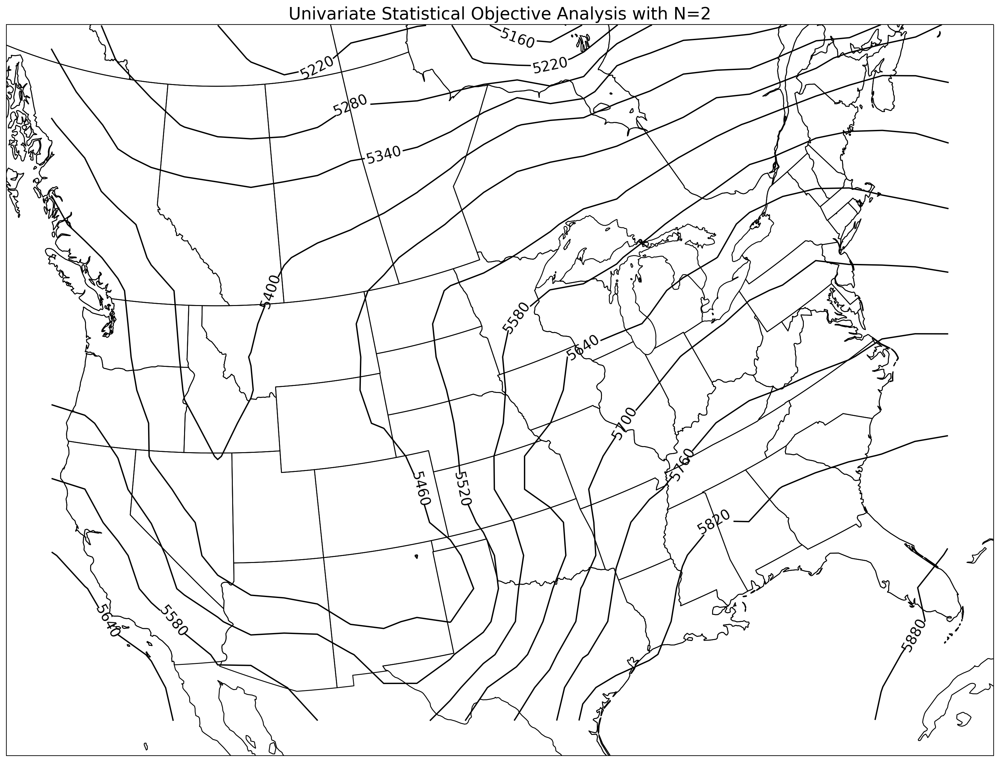

In [18]:
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':16})
cs1 = ax1.contour(LONS_grid, LATS_grid, analysis_arr[:,:,0], colors = 'k', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('Univariate Statistical Objective Analysis with N=2')
plt.show()

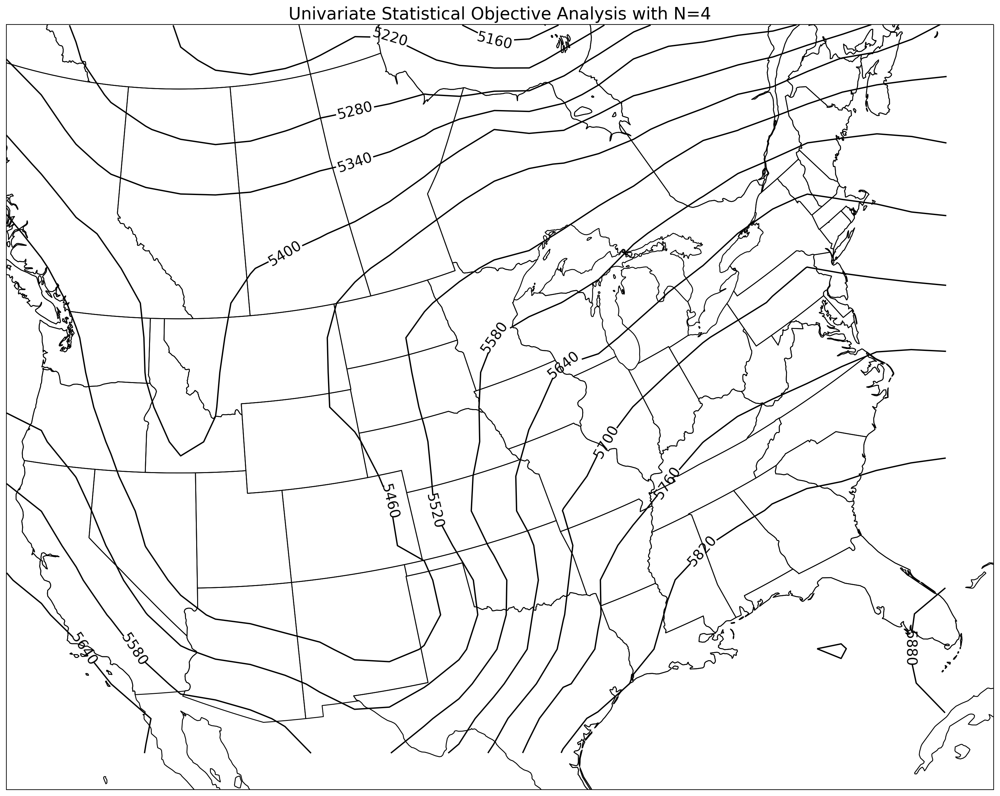

In [19]:
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':16})
cs1 = ax1.contour(LONS_grid, LATS_grid, analysis_arr[:,:,1], colors = 'k', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('Univariate Statistical Objective Analysis with N=4')
plt.show()

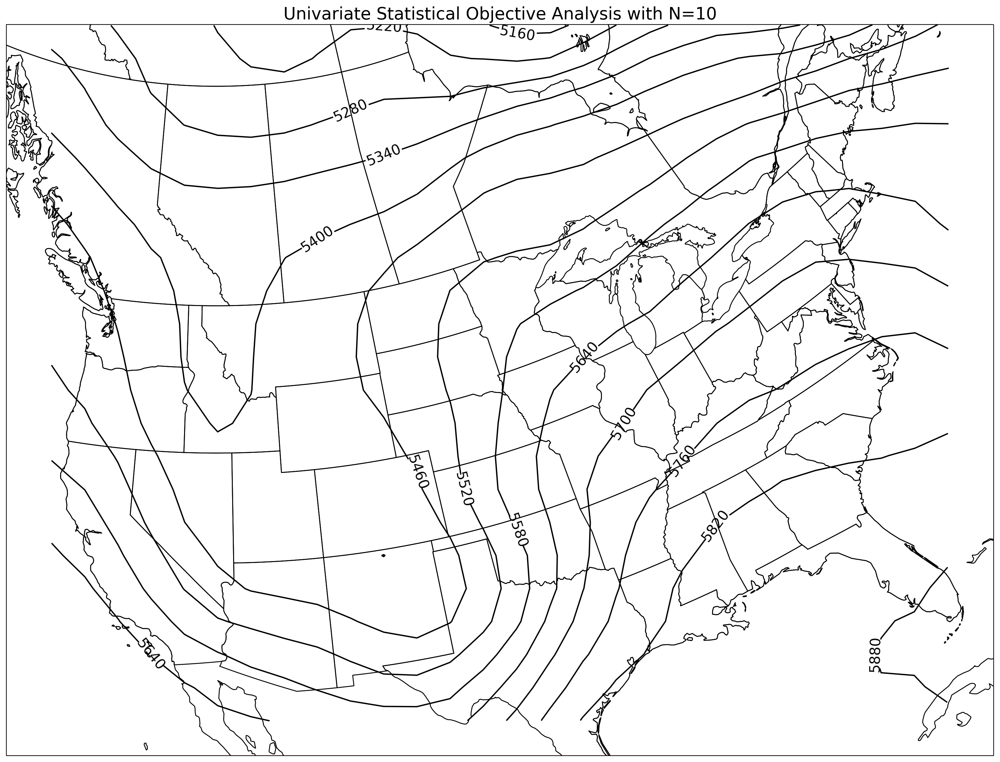

In [20]:
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':16})
cs1 = ax1.contour(LONS_grid, LATS_grid, analysis_arr[:,:,2], colors = 'k', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('Univariate Statistical Objective Analysis with N=10')
plt.show()

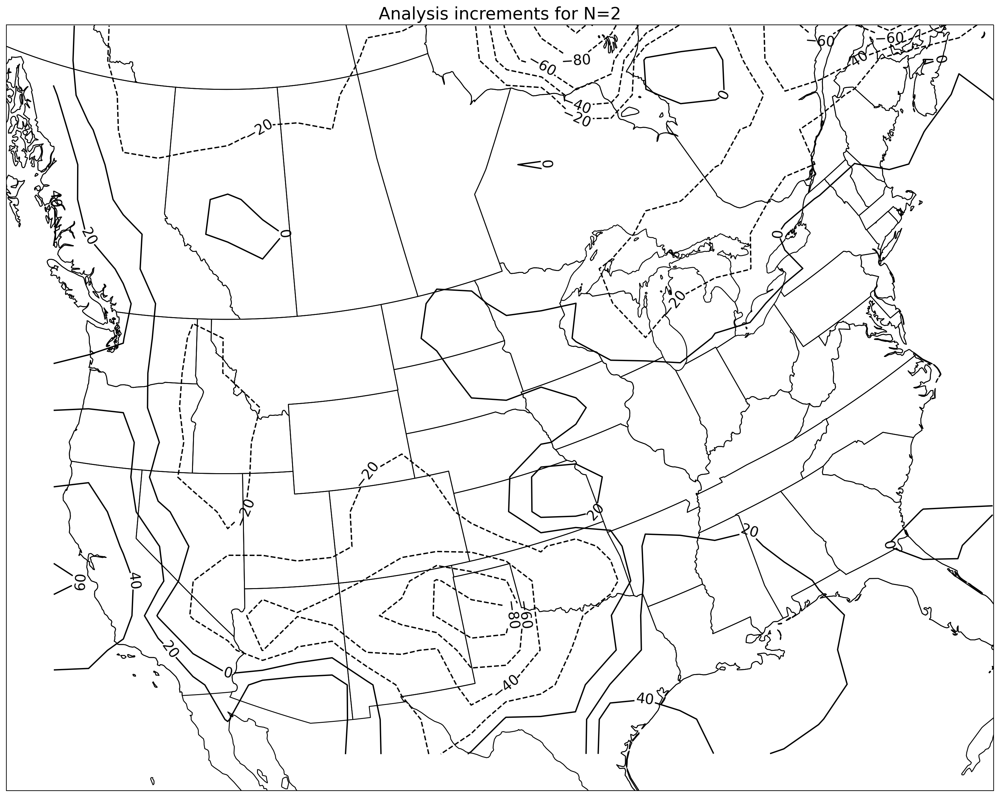

In [21]:
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':16})
cs1 = ax1.contour(LONS_grid, LATS_grid, anal_incs[:,:,0], colors = 'k', levels = np.arange(-100,100,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-100,100,20))
plt.title('Analysis increments for N=2')
plt.show()

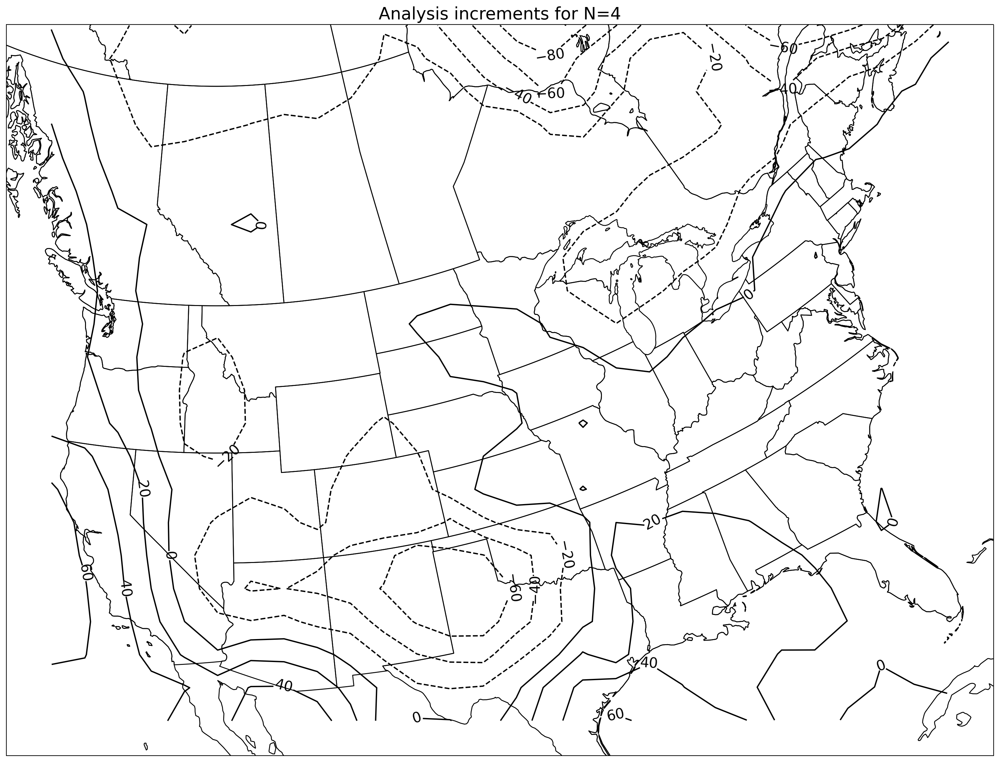

In [22]:
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':16})
cs1 = ax1.contour(LONS_grid, LATS_grid, anal_incs[:,:,1], colors = 'k', levels = np.arange(-100,100,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-100,100,20))
plt.title('Analysis increments for N=4')
plt.show()

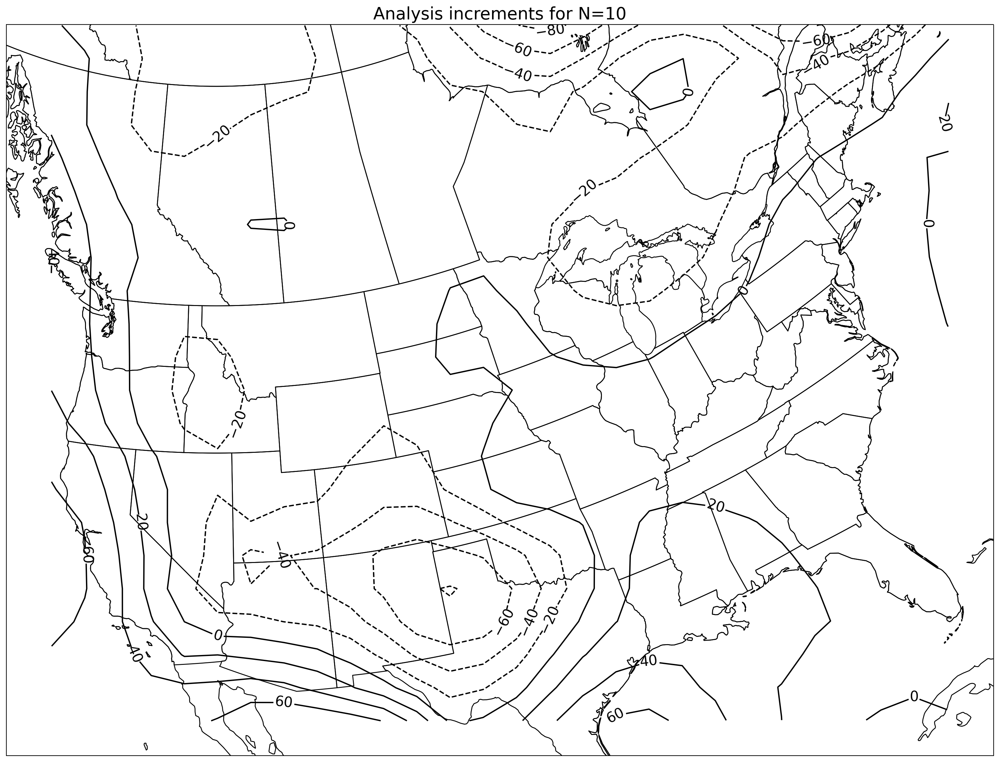

In [23]:
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':16})
cs1 = ax1.contour(LONS_grid, LATS_grid, anal_incs[:,:,2], colors = 'k', levels = np.arange(-100,100,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-100,100,20))
plt.title('Analysis increments for N=10')
plt.show()

In [24]:
#Write out analysis values, analysis increments, and analysis differences for each N for each point to the file
with open('Horan_HW3_N_2.txt', 'a+') as f:
    f.write('grid_point, analysis_value, analysis_increment\n')
    for i in range(len(xs)):
        for j in range(len(xs[0])):
            grid_point = str([i,j])
            analysis_val = str(analysis_arr[i,j,0])
            analysis_inc = str(anal_incs[i,j,0])
            out_str = grid_point + ',' + analysis_val + ',' + analysis_inc + '\n'
            f.write(out_str)

In [25]:
with open('Horan_HW3_N_4.txt', 'a+') as f:
    f.write('grid_point, analysis_value, analysis_increment\n')
    for i in range(len(xs)):
        for j in range(len(xs[0])):
            grid_point = str([i,j])
            analysis_val = str(analysis_arr[i,j,1])
            analysis_inc = str(anal_incs[i,j,1])
            out_str = grid_point + ',' + analysis_val + ',' + analysis_inc  + '\n'
            f.write(out_str)

In [26]:
with open('Horan_HW3_N_10.txt', 'a+') as f:
    f.write('grid_point, analysis_value, analysis_increment\n')
    for i in range(len(xs)):
        for j in range(len(xs[0])):
            grid_point = str([i,j])
            analysis_val = str(analysis_arr[i,j,2])
            analysis_inc = str(anal_incs[i,j,2])
            out_str = grid_point + ',' + analysis_val + ',' + analysis_inc  + '\n'
            f.write(out_str)

In [27]:
with open('Horan_analysis_differences.txt', 'a+') as f:
    f.write('obs_point, N, analysis_difference\n')
    for n in range(len(ns)):
        n_N = ns[n]
        for i in range(len(hgts_500)):
            obs_point = str(i)
            analysis_difference = str(anal_diff[i,n])
            out_str = obs_point + ',' + str(n_N) + ',' + analysis_difference + '\n'
            f.write(out_str)

In [ ]:
### In a separte text file (or below), answer the following questions ###
'''
1 - Describe the general features that you see in your contoured analyses.
    There is still a deep trough over New Mexico/Texas/Oklahoma with Zonal flow over the eastern half of the CONUS 

2 - Describe the differences that you see in your contoured analyses.  
    Does one analysis seem to be smoother than the other?  If so, what would cause this?
    N=10 seems to be smoother than the other, likely because it has more points to consider to get a smoother picture of it's surroundings. N=4 is sufficiently smooth, but likely without smoothing 
    out important shortwave features.

3 - What happens as you increase the number of points considered for the analysis?  Is this 
    desirable?  Why or why not?
    At N=2, lots of variability in the plotted analysis can be seen and it is not smooth, perhaps adding features which do not exist. N=4 seems to remove this problem
    without smoothing potential shortwave features. N=10 smooths out to only large scale synoptic features, which may not be desireable because it can smooth out shortwave features important
    to forecasting mesoscale or small synoptic scale events. RMS also shows that N=4 is the best pass (marginally) of all the passes that we did in this lab
    
'''